In [ ]:
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
import re

In [ ]:
!python -m pip install pyyaml==5.1

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 13.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=59c7e5bba9b7a545b4aa269d9daa4f7c862b7cc5a3c4b4718277e2f01579fa03
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

In [ ]:

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nINuGOi47lZzMi9SwCrK")
project = rf.workspace("iit-roorkee-yin7n").project("interiit-ttcw3")
dataset = project.version(2).download("coco-segmentation")




Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 701.2/701.2 KB 44.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 1.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=86cca641b5040c818a128d20d20a8f3a7023ee953f8051bc86ecc26b552741ef
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: P

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Interiit-2 in coco-segmentation:: 100%|██████████| 145/145 [00:00<00:00, 1864.52it/s]


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train_dt", {}, "/content/Interiit-2/train/_annotations.coco.json", "/content/Interiit-2/train")
register_coco_instances("val_datase", {}, "/content/Interiit-2/valid/_annotations.coco.json", "/content/Interiit-2/valid")

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_dt",)
cfg.DATASETS.TEST = ("val_datase",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2  
cfg.SOLVER.BASE_LR = 0.0028  
cfg.SOLVER.MAX_ITER = 4000    
cfg.SOLVER.STEPS = [1,    2000,    3400]       
cfg.SOLVER.GAMMA=0.8
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/04 06:12:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[02/04 06:12:24 d2.engine.train_loop]: Starting training from iteration 0
[02/04 06:12:32 d2.utils.events]:  eta: 0:25:03  iter: 19  total_loss: 1.835  loss_cls: 1.023  loss_box_reg: 0.07023  loss_mask: 0.6899  loss_rpn_cls: 0.03769  loss_rpn_loc: 0.006143  time: 0.3791  data_time: 0.0159  lr: 4.5307e-05  max_mem: 2957M
[02/04 06:12:40 d2.utils.events]:  eta: 0:25:36  iter: 39  total_loss: 1.112  loss_cls: 0.3293  loss_box_reg: 0.0725  loss_mask: 0.6162  loss_rpn_cls: 0.0493  loss_rpn_loc: 0.007693  time: 0.3901  data_time: 0.0097  lr: 9.0051e-05  max_mem: 2957M
[02/04 06:12:48 d2.utils.events]:  eta: 0:25:41  iter: 59  total_loss: 0.7947  loss_cls: 0.1328  loss_box_reg: 0.0917  loss_mask: 0.5212  loss_rpn_cls: 0.02044  loss_rpn_loc: 0.005311  time: 0.3939  data_time: 0.0084  lr: 0.00013479  max_mem: 2957M
[02/04 06:12:57 d2.utils.events]:  eta: 0:26:11  iter: 79  total_loss: 0.7737  loss_cls: 0.1324  loss_box_reg: 0.1243  loss_mask: 0.4743  loss_rpn_cls: 0.01123  loss_rpn_loc: 0.00506

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output
     

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10030), started 0:09:56 ago. (Use '!kill 10030' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import os
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   
predictor = DefaultPredictor(cfg)

[02/04 06:39:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [02/04 07:04:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/04 07:04:39 d2.data.datasets.coco]: Loaded 138 images in COCO format from /content/Interiit-2/train/_annotations.coco.json
[<detectron2.utils.visualizer.VisImage object at 0x7f089a338250>, <detectron2.utils.visualizer.VisImage object at 0x7f089963efa0>]
[<detectron2.utils.visualizer.VisImage object at 0x7f089a338250>, <detectron2.utils.visualizer.VisImage object at 0x7f089963efa0>, <detectron2.utils.visualizer.VisImage object at 0x7f089a338f10>]
[<detectron2.utils.visualizer.VisImage object at 0x7f089a338250>, <detectron2.utils.visualizer.VisImage object at 0x7f089963efa0>, <detectron2.utils.visualizer.VisImage object at 0x7f089a338f10>, <detectron2.utils.visualizer.VisImage object at 0x7f094c3e7970>]
[<detectron2.utils.visualizer.VisImage object at 0x7f089a338250>, <detectron2.utils.visualizer.VisImage object at 0x7f089963efa0>, <detectron2.util

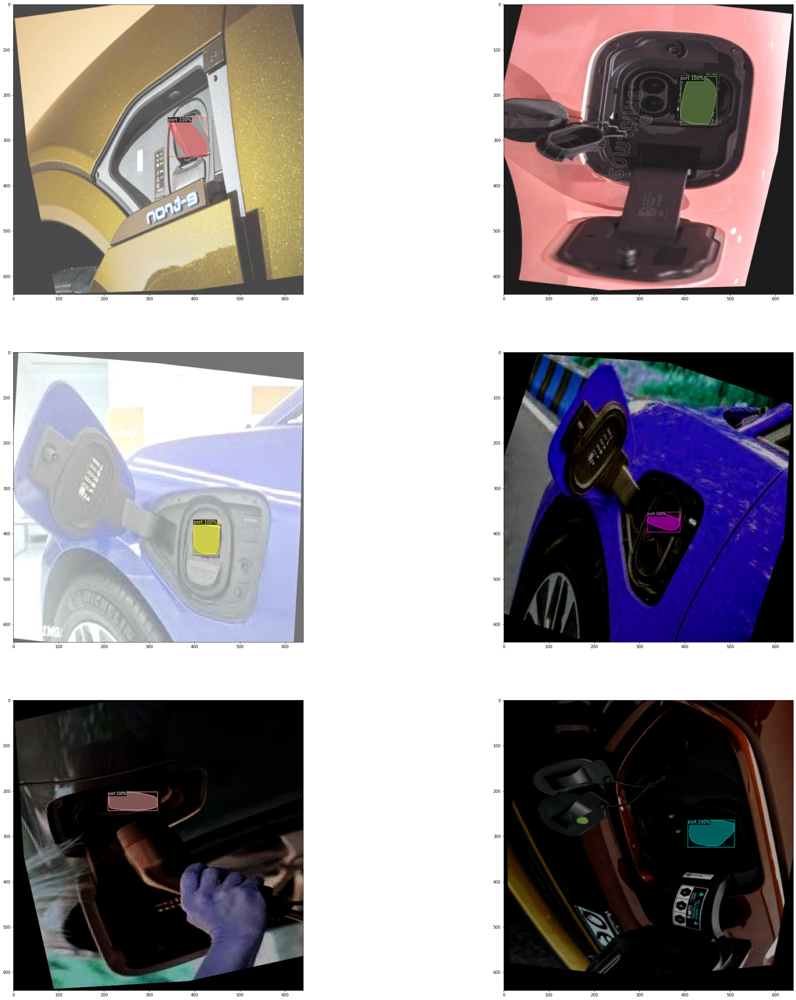

In [ ]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get('train_dt')
outs = []
for d in random.sample(dataset_dicts, 6):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    box=outputs["instances"].pred_boxes
    v = Visualizer(im[:, :, ::-1],
                   metadata = MetadataCatalog.get('train_dt')
                    
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train_dt'))
    #out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    print(outs)
    #outs.append(out_target)
_,axs = plt.subplots(len(outs)//2,2,figsize=(40,45))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])



img=out.get_image()[:, :, ::-1].copy()
print(img.shape)

print(box)
box=tuple(box)



In [ ]:
print(outputs)


{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[405.9956, 264.1803, 509.4767, 324.4803]], device='cuda:0')), scores: tensor([0.9997], device='cuda:0'), pred_classes: tensor([1], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')])}


In [ ]:
x=(box[0][0]+box[0][2])/2
y=(box[0][1]+box[0][3])/2
print(x,y)

tensor(457.7361, device='cuda:0') tensor(294.3303, device='cuda:0')


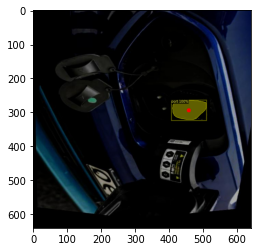

In [ ]:
contours_img=cv2.circle(img, (int(x),int(y)), 6, (0,0,255), -1)
plt.imshow(imutils.opencv2matplotlib(contours_img))
plt.show()